## Movies Review sentiment analysis

 import required libraries

In [ ]:
import nltk
import csv
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.tokenize import word_tokenize
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder
nltk.download("punkt")
nltk.download('wordnet')
import warnings
warnings.filterwarnings("ignore")

#stopword
nltk.download('stopwords')

# NN
import tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout,Embedding, Flatten,SimpleRNN,LSTM,GRU,Bidirectional

# preprocessing
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing import sequence

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
from google.colab import files
from google.colab import drive

In [ ]:
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
# call csv file and convert it to dataframe using Pandas function

df=pd.read_csv('/content/drive/MyDrive/IMDB Dataset.csv')

# .head() will give the first 5 rows of the dataset by default

df.head()

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive


In [ ]:
df =df.iloc[:10000]

In [ ]:
df['review'][1]

'A wonderful little production. <br /><br />The filming technique is very unassuming- very old-time-BBC fashion and gives a comforting, and sometimes discomforting, sense of realism to the entire piece. <br /><br />The actors are extremely well chosen- Michael Sheen not only "has got all the polari" but he has all the voices down pat too! You can truly see the seamless editing guided by the references to Williams\' diary entries, not only is it well worth the watching but it is a terrificly written and performed piece. A masterful production about one of the great master\'s of comedy and his life. <br /><br />The realism really comes home with the little things: the fantasy of the guard which, rather than use the traditional \'dream\' techniques remains solid then disappears. It plays on our knowledge and our senses, particularly with the scenes concerning Orton and Halliwell and the sets (particularly of their flat with Halliwell\'s murals decorating every surface) are terribly well d

In [ ]:
# .info() will give basic info about the dataset

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   review     10000 non-null  object
 1   sentiment  10000 non-null  object
dtypes: object(2)
memory usage: 156.4+ KB


In [ ]:
# The describe() method returns description of the data in the DataFrame.

df.describe()

,review,sentiment
count,10000,10000
unique,9983,2
top,"Beautiful film, pure Cassavetes style. Gena Ro...",positive
freq,2,5028


In [ ]:
# value_counts() returns object containing counts of unique values

df['sentiment'].value_counts()

positive    5028
negative    4972
Name: sentiment, dtype: int64

In [ ]:
# isnull().sum() gives the count of null values present in each column

df.isnull().sum()

review       0
sentiment    0
dtype: int64

In [ ]:
# Determines which duplicates (if any) to mark.

df.duplicated().sum()

17

In [ ]:
pos=' '.join(df[df["sentiment"]=="positive"]["review"])
pos

'One of the other reviewers has mentioned that after watching just 1 Oz episode you\'ll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me about Oz was its brutality and unflinching scenes of violence, which set in right from the word GO. Trust me, this is not a show for the faint hearted or timid. This show pulls no punches with regards to drugs, sex or violence. Its is hardcore, in the classic use of the word.<br /><br />It is called OZ as that is the nickname given to the Oswald Maximum Security State Penitentary. It focuses mainly on Emerald City, an experimental section of the prison where all the cells have glass fronts and face inwards, so privacy is not high on the agenda. Em City is home to many..Aryans, Muslims, gangstas, Latinos, Christians, Italians, Irish and more....so scuffles, death stares, dodgy dealings and shady agreements are never far away.<br /><br />I would say the main appeal of the show is due to the f

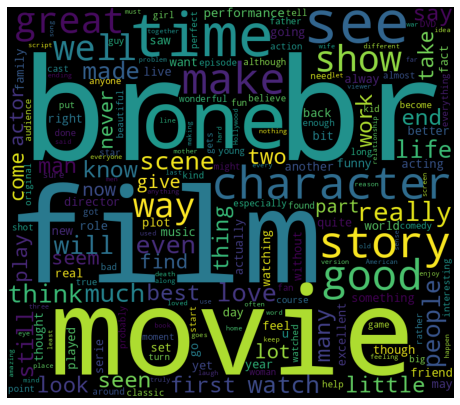

In [ ]:
# WordCloud is use to visualise textual data.

wc=WordCloud(width=800,height=700,min_font_size=10)
wc.generate(pos)
plt.figure(figsize=(8,8))
plt.imshow(wc)
plt.axis("off")
plt.show()

In [ ]:
neg=' '.join(df[df["sentiment"]=="negative"]["review"])
neg

'Basically there\'s a family where a little boy (Jake) thinks there\'s a zombie in his closet & his parents are fighting all the time.<br /><br />This movie is slower than a soap opera... and suddenly, Jake decides to become Rambo and kill the zombie.<br /><br />OK, first of all when you\'re going to make a film you must Decide if its a thriller or a drama! As a drama the movie is watchable. Parents are divorcing & arguing like in real life. And then we have Jake with his closet which totally ruins all the film! I expected to see a BOOGEYMAN similar movie, and instead i watched a drama with some meaningless thriller spots.<br /><br />3 out of 10 just for the well playing parents & descent dialogs. As for the shots with Jake: just ignore them. This show was an amazing, fresh & innovative idea in the 70\'s when it first aired. The first 7 or 8 years were brilliant, but things dropped off after that. By 1990, the show was not really funny anymore, and it\'s continued its decline further t

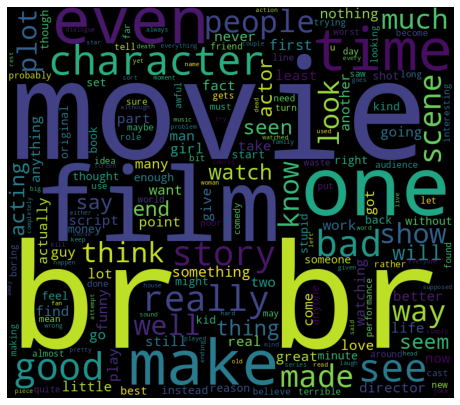

In [ ]:
#WordCloud

wc=WordCloud(width=800,height=700,min_font_size=10)
wc.generate(neg)
plt.figure(figsize=(8,8))
plt.imshow(wc)
plt.axis("off")
plt.show()

In [ ]:
# Feature and target selection

x = df["review"]
y = df ["sentiment"]

In [ ]:
# Label Encoding refers to converting the labels into a numeric form so as to convert them into the machine-readable form.

le= LabelEncoder()
y=le.fit_transform(y)
y

array([1, 1, 1, ..., 0, 0, 1])

In [ ]:
# train and test split

xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.3,random_state=1)

In [ ]:
# tokenization (to split paragraphs and sentences into smaller units)

tok=Tokenizer()
tok.fit_on_texts(xtrain)

In [ ]:
# vocubulary (The set of unique words used in the text corpus)

tok.word_index
voc=tok.word_index

In [ ]:
print(voc)

{'the': 1, 'a': 2, 'and': 3, 'of': 4, 'to': 5, 'is': 6, 'br': 7, 'in': 8, 'it': 9, 'i': 10, 'this': 11, 'that': 12, 'was': 13, 'as': 14, 'with': 15, 'movie': 16, 'for': 17, 'but': 18, 'film': 19, 'on': 20, 'you': 21, 'not': 22, 'are': 23, 'his': 24, 'have': 25, 'be': 26, 'one': 27, 'he': 28, 'all': 29, 'at': 30, 'by': 31, 'an': 32, 'they': 33, 'so': 34, 'who': 35, 'from': 36, 'like': 37, 'or': 38, 'just': 39, 'her': 40, 'about': 41, "it's": 42, 'out': 43, 'if': 44, 'has': 45, 'there': 46, 'what': 47, 'some': 48, 'good': 49, 'when': 50, 'more': 51, 'very': 52, 'up': 53, 'no': 54, 'my': 55, 'even': 56, 'she': 57, 'time': 58, 'would': 59, 'which': 60, 'story': 61, 'really': 62, 'only': 63, 'see': 64, 'their': 65, 'had': 66, 'well': 67, 'can': 68, 'me': 69, 'were': 70, 'much': 71, 'than': 72, 'been': 73, 'get': 74, 'because': 75, 'we': 76, 'great': 77, 'bad': 78, 'do': 79, 'will': 80, 'first': 81, 'other': 82, 'into': 83, 'people': 84, 'also': 85, 'most': 86, 'how': 87, 'him': 88, 'made': 

In [ ]:
xtrain.shape

(7000,)

In [ ]:
xtest.shape

(3000,)

In [ ]:
ytrain.shape

(7000,)

In [ ]:
voclen=len(voc)

In [ ]:
# Sequence (Sequence models are the machine learning models that input or output sequences of data)

trainseq=tok.texts_to_sequences(xtrain)

In [ ]:
print(trainseq)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
 len(trainseq)

7000

In [ ]:
# doc length

doclen=[]
for i in trainseq:
    doclen.append(len(i))

print(doclen)


[658, 858, 178, 261, 146, 215, 349, 140, 116, 626, 84, 103, 788, 536, 147, 146, 191, 635, 108, 492, 112, 80, 119, 149, 142, 197, 828, 123, 233, 127, 51, 108, 58, 49, 174, 89, 103, 282, 322, 58, 236, 142, 129, 226, 393, 150, 93, 151, 107, 142, 860, 212, 187, 139, 153, 232, 95, 236, 103, 113, 328, 701, 163, 617, 134, 232, 211, 140, 492, 323, 162, 96, 184, 215, 135, 153, 238, 264, 139, 163, 128, 368, 170, 18, 241, 171, 143, 871, 123, 158, 58, 194, 111, 91, 315, 142, 73, 311, 641, 60, 988, 267, 727, 137, 80, 322, 178, 310, 587, 49, 422, 584, 196, 55, 199, 304, 260, 296, 223, 372, 112, 107, 136, 189, 118, 179, 93, 160, 153, 390, 248, 169, 345, 128, 138, 377, 90, 179, 267, 88, 283, 255, 131, 77, 316, 63, 110, 127, 276, 126, 127, 361, 254, 252, 116, 153, 166, 147, 457, 120, 404, 243, 650, 28, 665, 157, 174, 383, 251, 544, 310, 262, 115, 82, 634, 503, 35, 113, 498, 123, 124, 279, 124, 104, 164, 135, 170, 118, 70, 76, 167, 50, 450, 98, 137, 401, 469, 96, 150, 281, 367, 121, 110, 143, 291, 844, 

In [ ]:
max(doclen)

1850

In [ ]:
# Quantile (calculates the quantile of the values in a given axis)

np.quantile(doclen,1)

1850

In [ ]:
np.quantile(doclen,0.99)

893.0100000000002

In [ ]:
max_length=np.quantile(doclen,1)

In [ ]:
# Padding (add the zeros at the end of the sequence to make the samples in the same size)

trainmatrix = sequence.pad_sequences(trainseq,maxlen = max_length)
trainmatrix

array([[   0,    0,    0, ...,    7,  701,  151],
       [   0,    0,    0, ...,   41,   11,  119],
       [   0,    0,    0, ...,   39,  104,    9],
       ...,
       [   0,    0,    0, ...,    3,  269, 6845],
       [   0,    0,    0, ..., 3647,  464,  151],
       [   0,    0,    0, ...,   67,  223, 7112]], dtype=int32)

In [ ]:
# testing data must be of same length as training data.
# we dont tokenize testing data, we use already tokenized words.
# convert test data into sequence

testseq = tok.texts_to_sequences(xtest)

In [ ]:
# padding on test data

testmatrix = sequence.pad_sequences(testseq,maxlen = max_length)
testmatrix

array([[    0,     0,     0, ...,  1059,   313,   233],
       [    0,     0,     0, ...,    80,  2114,   173],
       [    0,     0,     0, ...,  1405,   643,    21],
       ...,
       [    0,     0,     0, ...,   256,     9,  1631],
       [    0,     0,     0, ...,  6723,     3, 20869],
       [    0,     0,     0, ...,   188,  8399,  4999]], dtype=int32)

In [ ]:
testmatrix.shape

(3000, 1850)

In [ ]:
trainmatrix.shape

(7000, 1850)

In [ ]:
# creating neural network (Flatten)

model8= Sequential()
model8.add(Embedding(input_dim=voclen+1,
output_dim=100,
input_length=max_length,
mask_zero=True))
model8.add(Flatten())
model8.add(Dense(16,activation="relu"))
model8.add(Dense(8,activation="relu"))
model8.add(Dense(1,activation="sigmoid"))

In [ ]:
# input of dimension, of all the tokens i.e. 7382.
# dont use 0 for the training purpose, hence we need to use mask_zero.
# this is a binary class classification.

In [ ]:
model8.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 1850, 100)         5085800   
                                                                 
 flatten (Flatten)           (None, 185000)            0         
                                                                 
 dense (Dense)               (None, 16)                2960016   
                                                                 
 dense_1 (Dense)             (None, 8)                 136       
                                                                 
 dense_2 (Dense)             (None, 1)                 9         
                                                                 
Total params: 8,045,961
Trainable params: 8,045,961
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model8.compile(optimizer = "adam", loss = "binary_crossentropy",metrics ="accuracy")
model8.fit(trainmatrix,ytrain,epochs=10,batch_size=32)

Epoch 1/10
219/219 [==============================] - 37s 161ms/step - loss: 0.6697 - accuracy: 0.5853
Epoch 2/10
219/219 [==============================] - 35s 161ms/step - loss: 0.2535 - accuracy: 0.9070
Epoch 3/10
219/219 [==============================] - 34s 155ms/step - loss: 0.0383 - accuracy: 0.9939
Epoch 4/10
219/219 [==============================] - 35s 159ms/step - loss: 0.0079 - accuracy: 0.9996
Epoch 5/10
219/219 [==============================] - 35s 159ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 6/10
219/219 [==============================] - 34s 156ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 7/10
219/219 [==============================] - 37s 170ms/step - loss: 8.6976e-04 - accuracy: 1.0000
Epoch 8/10
219/219 [==============================] - 34s 157ms/step - loss: 5.9956e-04 - accuracy: 1.0000
Epoch 9/10
219/219 [==============================] - 34s 157ms/step - loss: 4.3425e-04 - accuracy: 1.0000
Epoch 10/10
219/219 [==============================] - 34s 15

In [ ]:
# prediction

ypred = model8.predict(testmatrix)
ypred

94/94 [==============================] - 1s 12ms/step


array([[2.5846265e-04],
       [3.5036051e-01],
       [9.9933654e-01],
       ...,
       [9.9506128e-01],
       [9.9934006e-01],
       [9.9089104e-01]], dtype=float32)

In [ ]:
# logistic regression always gives us probability.

ypred = np.where(ypred>=0.5,1,0)
ypred

array([[0],
       [0],
       [1],
       ...,
       [1],
       [1],
       [1]])

In [ ]:
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           0       0.88      0.88      0.88      1478
           1       0.88      0.88      0.88      1522

    accuracy                           0.88      3000
   macro avg       0.88      0.88      0.88      3000
weighted avg       0.88      0.88      0.88      3000



In [ ]:
# Creating NEURAL Network (Simple RNN)

model=Sequential()
model.add(Embedding(input_dim=voclen+1,  #input will be all the tokens + 1 for the (0)
          output_dim=100,
          input_length=max_length,
          mask_zero=True))     #mask zero will skip all the zeros
model.add(SimpleRNN(32))
model.add(Dense(16,activation="relu"))
model.add(Dense(8,activation="relu"))
model.add(Dense(1,activation="sigmoid"))

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 1850, 100)         5085800   
                                                                 
 simple_rnn (SimpleRNN)      (None, 32)                4256      
                                                                 
 dense_3 (Dense)             (None, 16)                528       
                                                                 
 dense_4 (Dense)             (None, 8)                 136       
                                                                 
 dense_5 (Dense)             (None, 1)                 9         
                                                                 
Total params: 5,090,729
Trainable params: 5,090,729
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.compile(optimizer="adam",loss="binary_crossentropy",metrics="accuracy")
model.fit(trainmatrix,ytrain,epochs=10,batch_size=32)

Epoch 1/10
219/219 [==============================] - 601s 3s/step - loss: 0.6827 - accuracy: 0.5509
Epoch 2/10
219/219 [==============================] - 590s 3s/step - loss: 0.3887 - accuracy: 0.8394
Epoch 3/10
219/219 [==============================] - 596s 3s/step - loss: 0.0600 - accuracy: 0.9814
Epoch 4/10
219/219 [==============================] - 587s 3s/step - loss: 0.0088 - accuracy: 0.9984
Epoch 5/10
219/219 [==============================] - 582s 3s/step - loss: 8.5346e-04 - accuracy: 1.0000
Epoch 6/10
219/219 [==============================] - 582s 3s/step - loss: 3.5000e-04 - accuracy: 1.0000
Epoch 7/10
219/219 [==============================] - 580s 3s/step - loss: 2.1246e-04 - accuracy: 1.0000
Epoch 8/10
219/219 [==============================] - 579s 3s/step - loss: 1.4446e-04 - accuracy: 1.0000
Epoch 9/10
219/219 [==============================] - 585s 3s/step - loss: 1.0424e-04 - accuracy: 1.0000
Epoch 10/10
219/219 [==============================] - 580s 3s/step - l

In [ ]:
# Prediction

ypred=model.predict(testmatrix)
ypred

94/94 [==============================] - 17s 175ms/step


array([[3.1784314e-04],
       [9.8784465e-01],
       [9.9942291e-01],
       ...,
       [9.9983263e-01],
       [9.9979383e-01],
       [9.9989367e-01]], dtype=float32)

In [ ]:
ypred=np.where(ypred>=0.5,1,0)
ypred

array([[0],
       [1],
       [1],
       ...,
       [1],
       [1],
       [1]])

In [ ]:
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           0       0.74      0.72      0.73      1478
           1       0.74      0.76      0.75      1522

    accuracy                           0.74      3000
   macro avg       0.74      0.74      0.74      3000
weighted avg       0.74      0.74      0.74      3000



In [ ]:
# Creating NEURAL Network  (Bidirectional RNN)

model1=Sequential()
model1.add(Embedding(input_dim=voclen+1,  #input will be all the tokens + 1 for the (0)
          output_dim=100,
          input_length=max_length,
          mask_zero=True))     #mask zero will skip all the zeros
model1.add(Bidirectional(SimpleRNN(32)))
model1.add(Dense(16,activation="relu"))
model1.add(Dense(8,activation="relu"))
model1.add(Dense(1,activation="sigmoid"))

In [ ]:
model1.compile(optimizer="adam",loss="binary_crossentropy",metrics="accuracy")
model1.fit(trainmatrix,ytrain,epochs=5,batch_size=64)

Epoch 1/5
110/110 [==============================] - 179s 2s/step - loss: 0.6938 - accuracy: 0.4981
Epoch 2/5
110/110 [==============================] - 177s 2s/step - loss: 0.6152 - accuracy: 0.6930
Epoch 3/5
110/110 [==============================] - 178s 2s/step - loss: 0.1513 - accuracy: 0.9526
Epoch 4/5
110/110 [==============================] - 174s 2s/step - loss: 0.0106 - accuracy: 0.9989
Epoch 5/5
110/110 [==============================] - 175s 2s/step - loss: 0.0016 - accuracy: 0.9999


In [ ]:
# Prediction

ypred=model1.predict(testmatrix)
ypred

94/94 [==============================] - 16s 169ms/step


array([[0.09847265],
       [0.9973048 ],
       [0.9973755 ],
       ...,
       [0.95904267],
       [0.95888776],
       [0.52311397]], dtype=float32)

In [ ]:
ypred=np.where(ypred>=0.5,1,0)
ypred
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           0       0.71      0.64      0.67      1478
           1       0.68      0.75      0.71      1522

    accuracy                           0.69      3000
   macro avg       0.70      0.69      0.69      3000
weighted avg       0.70      0.69      0.69      3000



In [ ]:
# Multi-layer RNN

model3=Sequential()
model3.add(Embedding(input_dim=voclen+1,
          output_dim=100,
          input_length=max_length,
          mask_zero=True))
model3.add(SimpleRNN(32,return_sequences=True))
model3.add(SimpleRNN(32))
model3.add(Dense(16,activation="relu"))
model3.add(Dropout(0.2))
model3.add(Dense(8,activation="relu"))
model3.add(Dense(1,activation="sigmoid"))

In [ ]:
model3.compile(optimizer="adam",loss="binary_crossentropy",metrics="accuracy")
model3.fit(trainmatrix,ytrain,epochs=10,batch_size=128)

Epoch 1/10
55/55 [==============================] - 108s 2s/step - loss: 0.6949 - accuracy: 0.5109
Epoch 2/10
55/55 [==============================] - 106s 2s/step - loss: 0.6091 - accuracy: 0.6903
Epoch 3/10
55/55 [==============================] - 112s 2s/step - loss: 0.3269 - accuracy: 0.8763
Epoch 4/10
55/55 [==============================] - 108s 2s/step - loss: 0.0803 - accuracy: 0.9819
Epoch 5/10
55/55 [==============================] - 108s 2s/step - loss: 0.0171 - accuracy: 0.9980
Epoch 6/10
55/55 [==============================] - 108s 2s/step - loss: 0.0050 - accuracy: 1.0000
Epoch 7/10
55/55 [==============================] - 107s 2s/step - loss: 0.0028 - accuracy: 1.0000
Epoch 8/10
55/55 [==============================] - 109s 2s/step - loss: 0.0021 - accuracy: 1.0000
Epoch 9/10
55/55 [==============================] - 112s 2s/step - loss: 0.0017 - accuracy: 1.0000
Epoch 10/10
55/55 [==============================] - 107s 2s/step - loss: 0.0013 - accuracy: 1.0000


In [ ]:
ypred=model3.predict(testmatrix)
ypred=np.where(ypred>=0.5,1,0)
print(classification_report(ytest,ypred))

94/94 [==============================] - 22s 228ms/step
              precision    recall  f1-score   support

           0       0.77      0.80      0.78      1478
           1       0.80      0.76      0.78      1522

    accuracy                           0.78      3000
   macro avg       0.78      0.78      0.78      3000
weighted avg       0.78      0.78      0.78      3000



In [ ]:
# LSTM  (Long Short Term Memory)

model4=Sequential()
model4.add(Embedding(input_dim=voclen+1,  #input will be all the tokens + 1 for the (0)
          output_dim=100,
          input_length=max_length,
          mask_zero=True))     #mask zero will skip all the zeros

model4.add(LSTM(32))
model4.add(Dense(16,activation="relu"))
model4.add(Dropout(0.2))
model4.add(Dense(8,activation="relu"))
model4.add(Dense(1,activation="sigmoid"))

In [ ]:
model4.compile(optimizer="adam",loss="binary_crossentropy",metrics="accuracy")
model4.fit(trainmatrix,ytrain,epochs=5,batch_size=64)

Epoch 1/5
110/110 [==============================] - 142s 1s/step - loss: 0.6176 - accuracy: 0.6743
Epoch 2/5
110/110 [==============================] - 137s 1s/step - loss: 0.2907 - accuracy: 0.8903
Epoch 3/5
110/110 [==============================] - 139s 1s/step - loss: 0.1055 - accuracy: 0.9676
Epoch 4/5
110/110 [==============================] - 143s 1s/step - loss: 0.0481 - accuracy: 0.9881
Epoch 5/5
110/110 [==============================] - 142s 1s/step - loss: 0.0160 - accuracy: 0.9954


In [ ]:
# Prediction

ypred=model4.predict(testmatrix)
ypred

94/94 [==============================] - 19s 191ms/step


array([[1.5841446e-04],
       [5.3571695e-03],
       [9.9918777e-01],
       ...,
       [9.9977928e-01],
       [9.8274136e-01],
       [9.9965245e-01]], dtype=float32)

In [ ]:
ypred=np.where(ypred>=0.5,1,0)
ypred
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           0       0.88      0.79      0.83      1478
           1       0.81      0.89      0.85      1522

    accuracy                           0.84      3000
   macro avg       0.85      0.84      0.84      3000
weighted avg       0.85      0.84      0.84      3000



In [ ]:
# GRU (Gated Recurrent Units)

model5=Sequential()
model5.add(Embedding(input_dim=voclen+1,
          output_dim=100,
          input_length=max_length,
          mask_zero=True))

model5.add(GRU(32))
model5.add(Dense(16,activation="relu"))
model5.add(Dropout(0.2))
model5.add(Dense(8,activation="relu"))
model5.add(Dense(1,activation="sigmoid"))

In [ ]:
model5.compile(optimizer="adam",loss="binary_crossentropy",metrics="accuracy")
model5.fit(trainmatrix,ytrain,epochs=5,batch_size=32)

Epoch 1/5
219/219 [==============================] - 453s 2s/step - loss: 0.5763 - accuracy: 0.6849
Epoch 2/5
219/219 [==============================] - 433s 2s/step - loss: 0.2646 - accuracy: 0.9014
Epoch 3/5
219/219 [==============================] - 444s 2s/step - loss: 0.1049 - accuracy: 0.9673
Epoch 4/5
219/219 [==============================] - 449s 2s/step - loss: 0.0624 - accuracy: 0.9819
Epoch 5/5
219/219 [==============================] - 523s 2s/step - loss: 0.0322 - accuracy: 0.9900


In [ ]:
ypred=model5.predict(testmatrix)
ypred=np.where(ypred>=0.5,1,0)

94/94 [==============================] - 35s 347ms/step


In [ ]:
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           0       0.81      0.87      0.84      1478
           1       0.86      0.80      0.83      1522

    accuracy                           0.83      3000
   macro avg       0.84      0.84      0.83      3000
weighted avg       0.84      0.83      0.83      3000

